In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline

In [2]:
alldt = pd.read_csv('Environment_Temperature_change_E_All_Data_NOFLAG.csv', encoding='latin-1')
codes = pd.read_csv('countries_codes_and_coordinates.csv')

In [3]:
dt_ec = alldt.set_index('Months Code',drop = False)

In [4]:
# dt_ec[dt_ec['Area'] == 'Afghanistan']

In [5]:
len(dt_ec['Area'].unique())

284

In [6]:
countries = dt_ec['Area'].unique()[:247]

In [7]:
dt_tran = dt_ec[dt_ec['Months Code'] == 7020][::2].transpose()

In [8]:
month = alldt[alldt['Months Code'] == 7020][::2].reset_index(drop=True)

In [9]:
month = month.drop(columns = ['Area Code','Area','Months Code','Months','Element Code','Element','Unit'])

In [10]:
dt_tran = month.transpose()

In [11]:
dt_tran['284'] = ''
dt_tran['285'] = ''
dt_tran['286'] = ''

In [12]:
test = dt_tran.transpose()

In [13]:
for i in range(len(dt_tran)):
    test.iloc[285,i] = np.mean(test.iloc[:284,i])
    
    test.iloc[284,i] = np.array(test.iloc[285,i]) - np.array(np.std(test.iloc[:284,i]))

    test.iloc[286,i] = np.array(test.iloc[285,i]) + np.array(np.std(test.iloc[:284,i]))
    
        

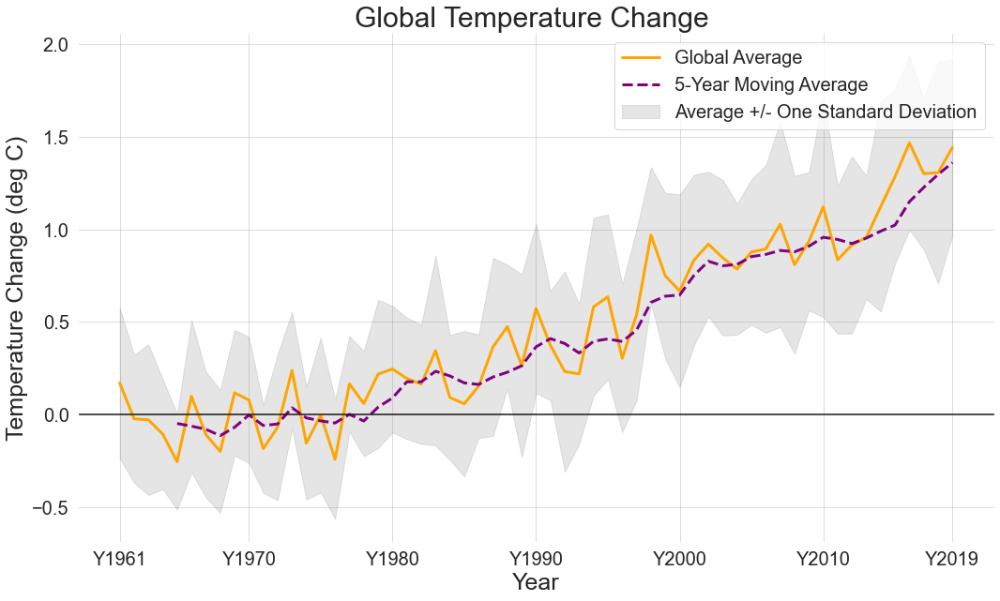

In [14]:
size = 10
yscale = size
xscale = 1.75 * yscale

sns.set(rc={'axes.facecolor':'white','grid.color':'#bababa','grid.alpha':0.5})

fig  = plt.figure(figsize = (xscale,yscale))
plt.plot(test.iloc[285,:],label='Global Average',color='orange',linewidth=3)
plt.plot(pd.DataFrame(test.iloc[285,:]).rolling(5).mean(),label='5-Year Moving Average',linestyle='--',color='purple',linewidth=3)


plt.fill_between(x=np.arange(0,len(list(test.iloc[284,:]))),y1=list(test.iloc[284,:]),y2 = list(test.iloc[286,:]),color='gray',alpha=0.2,label='Average +/- One Standard Deviation')
# plt.plot(test.iloc[284,:],c='r')
# plt.plot(test.iloc[286,:],c='g')
plt.axhline(y=0,c='k')
plt.xticks([0,9,19,29,39,49,58],fontsize=20)
plt.yticks(fontsize=20)
plt.title('Global Temperature Change ',fontsize=30)
plt.ylabel('Temperature Change (deg C)',fontsize=25)
plt.xlabel('Year',fontsize=25)
plt.legend(fontsize=20)

# plt.savefig('Globavg.png',dpi=500)
# sns.despine()

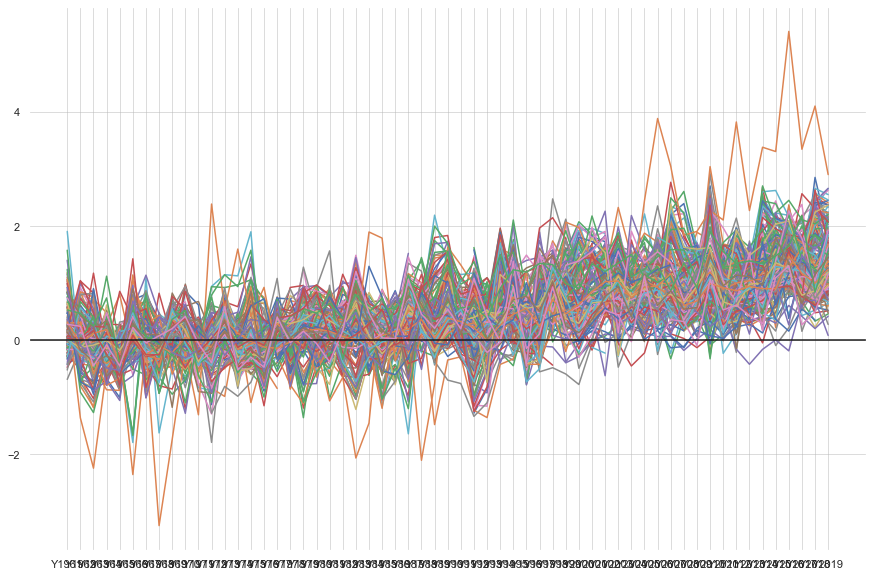

In [15]:
fig = plt.figure(figsize = (15,10))
for country in countries:
    plt.plot((dt_ec[dt_ec['Months Code'] == 7020][dt_ec[dt_ec['Months Code'] == 7020]['Area'] == country][::2]).loc[7020][7:])
plt.axhline(y=0,c='k')

In [16]:
cds = codes.set_index('Country',drop=False)

In [17]:
new_eth = np.array(list(alldt[alldt.Area == 'Ethiopia PDR'][alldt[alldt.Area == 'Ethiopia PDR']['Months Code'] == 7020].iloc[0])[:39] + list(alldt[alldt.Area == 'Ethiopia'][alldt[alldt.Area == 'Ethiopia']['Months Code'] == 7020].iloc[0])[39:])

In [18]:
#corrections in this cell
cds.loc['United States','Country'] = 'United States of America'
cds.loc['Bolivia','Country'] = 'Bolivia (Plurinational State of)'
cds.loc['Virgin Islands, British','Country'] = 'British Virgin Islands'
cds.loc["Korea, Democratic People's Republic of",'Country'] = "Democratic People's Republic of Korea"
cds.loc['Congo, the Democratic Republic of the','Country'] = 'Democratic Republic of the Congo'
cds.loc['Iran, Islamic Republic of','Country'] = 'Iran (Islamic Republic of)'
cds.loc['Micronesia, Federated States of','Country'] = 'Micronesia (Federated States of)'
cds.loc['Palestinian Territory, Occupied','Country'] = 'Palestine'
cds.loc['Korea, Republic of','Country'] = 'Republic of Korea'
cds.loc['Moldova, Republic of','Country'] = 'Republic of Moldova'
cds.loc['Russia','Country'] = 'USSR'

cds.loc['Sudan','Country'] = 'Sudan'
cds.loc['Tanzania, United Republic of','Country'] = 'United Republic of Tanzania'
cds.loc['Venezuela, Bolivarian Republic of','Country'] = 'Venezuela (Bolivarian Republic of)'
cds.loc['Ethiopia','Country'] = 'Ethiopia PDR'

In [19]:
# alldt[alldt.Area == 'Ethiopia PDR'][alldt[alldt.Area == 'Ethiopia PDR']['Months Code'] == 7020]

In [20]:
# new_rus = np.array(list(alldt[alldt.Area == 'USSR'][alldt[alldt.Area == 'USSR']['Months Code'] == 7020].iloc[0])[:39] + list(alldt[alldt.Area == 'Russia'][alldt[alldt.Area == 'Russia']['Months Code'] == 7020].iloc[0])[39:])
# new_rus[1] = 'Russia'

In [21]:
# new = alldt[alldt.Area == 'USSR'][alldt[alldt.Area == 'USSR']['Months Code'] == 7020][::2]
# # replace_old = alldt[alldt.Area == 'USSR'][alldt[alldt.Area == 'USSR']['Months Code'] == 7020][::2].loc[8022][7:38]
# replace_old = alldt[alldt.Area == 'Russian Federation'][alldt[alldt.Area == 'Russian Federation']['Months Code'] == 7020][::2].loc[6220][38:]
# new

In [22]:
# new_arry = np.array(new)[0]
# for i in range(len(replace_old)):
#     new_arry[38+i] = replace_old[i]

In [23]:
# new_arry[1] = 'Russia'
# new_arry #compiled data for Russia

In [24]:
# alldt.loc[8022] = new_rus #new russia row
# alldt.loc[2548] = new_eth #new eth row

In [25]:
# len(alldt.loc[2582]),len(new_eth)

In [26]:
# newdt.loc[2582,:] = new_eth

In [27]:
cds = cds.set_index('Country',drop=False)

In [28]:
newdt = alldt.copy()

In [29]:
newdt['CC'] = ''
# newdt['lat'] = np.nan
# newdt['lon'] = np.nan

In [30]:
newdt = newdt.reindex(columns = newdt.columns.tolist() + ['lat','lon'])


In [31]:
#with re
import re
s = "string. With. Punctuation?"
s = re.sub(r'[^\w\s]','',s)
#without re
s = "string. With. Punctuation?"
s.translate(str.maketrans('', '', string.punctuation))

NameError: name 'string' is not defined

In [32]:
s.translate(str.maketrans('', '', string.punctuation))

NameError: name 'string' is not defined

In [33]:
cds

,Country,Alpha-2 code,Alpha-3 code,Numeric code,Latitude (average),Longitude (average)
Country,,,,,,
Afghanistan,Afghanistan,"""AF""","""AFG""","""4""","""33""","""65"""
Albania,Albania,"""AL""","""ALB""","""8""","""41""","""20"""
Algeria,Algeria,"""DZ""","""DZA""","""12""","""28""","""3"""
American Samoa,American Samoa,"""AS""","""ASM""","""16""","""-14.3333""","""-170"""
Andorra,Andorra,"""AD""","""AND""","""20""","""42.5""","""1.6"""
...,...,...,...,...,...,...
Wallis and Futuna,Wallis and Futuna,"""WF""","""WLF""","""876""","""-13.3""","""-176.2"""
Western Sahara,Western Sahara,"""EH""","""ESH""","""732""","""24.5""","""-13"""
Yemen,Yemen,"""YE""","""YEM""","""887""","""15""","""48"""


In [34]:
import string
exc = '!"#$%&\'()*+,/:;<=>?@[\\]^_`{|}~'
not_inc = []
for row in range(len(newdt)):          #adding 3 digit country codes
    cntry = newdt.loc[row,'Area']
    if cntry in cds.Country:
        s = cds.loc[cntry,'Alpha-3 code']
        out = s.translate(str.maketrans('', '', string.punctuation))
        CC = out.strip()
        
        lat = float(cds.loc[cntry,'Latitude (average)'].translate(str.maketrans('', '', exc)).strip())
        lon = float(cds.loc[cntry,'Longitude (average)'].translate(str.maketrans('', '', exc)).strip())
        
    else:
        not_inc.append(cntry)
        CC = np.nan
        
    newdt.loc[row,'CC'] = CC
    newdt.loc[row,'lat'] = lat
    newdt.loc[row,'lon'] = lon

In [35]:
x = newdt[newdt['Months Code'] == 7020][::2].reset_index(drop=True)

In [36]:
x['avg'] = np.nan

In [37]:
for i in range(len(x)):
    x.loc[i,'avg'] = np.mean(x.loc[i][7:66])

In [38]:
x = x.dropna()

In [39]:
not_in = [] #unique elements in not_inc
for elem in not_inc:
    if elem not in not_in:
        not_in.append(elem)
    

In [40]:
not_in

['Belgium-Luxembourg',
 'Cabo Verde',
 'Channel Islands',
 'China, Hong Kong SAR',
 'China, Macao SAR',
 'China, mainland',
 'China, Taiwan Province of',
 'Czechia',
 'Czechoslovakia',
 'Eswatini',
 'Ethiopia',
 'French Southern and Antarctic Territories',
 'Holy See',
 'Midway Island',
 'Netherlands Antilles (former)',
 'North Macedonia',
 'Pacific Islands Trust Territory',
 'Pitcairn Islands',
 'Serbia and Montenegro',
 'Sudan (former)',
 'Svalbard and Jan Mayen Islands',
 'United States Virgin Islands',
 'Wake Island',
 'Wallis and Futuna Islands',
 'Yugoslav SFR',
 'World',
 'Africa',
 'Eastern Africa',
 'Middle Africa',
 'Northern Africa',
 'Southern Africa',
 'Western Africa',
 'Americas',
 'Northern America',
 'Central America',
 'Caribbean',
 'South America',
 'Asia',
 'Central Asia',
 'Eastern Asia',
 'Southern Asia',
 'South-Eastern Asia',
 'Western Asia',
 'Europe',
 'Eastern Europe',
 'Northern Europe',
 'Southern Europe',
 'Western Europe',
 'Oceania',
 'Australia and New 

In [41]:
np.array(not_in[:37])[np.array(not_in[:37]) == 'Sudan (former)']

array(['Sudan (former)'], dtype='<U41')

In [42]:
allnona = newdt.dropna()
# allnona = newdt

In [43]:
tchange = allnona[allnona['Months Code'] == 7020][allnona[allnona['Months Code'] == 7020]['Element Code'] == 7271]

In [44]:
tchange.loc[32,'CC']

'AFG'

In [45]:
tchange[tchange['Area'] == 'Sudan (former)']

,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,CC,lat,lon


In [46]:
tchange.keys()[7:66]

Index(['Y1961', 'Y1962', 'Y1963', 'Y1964', 'Y1965', 'Y1966', 'Y1967', 'Y1968',
       'Y1969', 'Y1970', 'Y1971', 'Y1972', 'Y1973', 'Y1974', 'Y1975', 'Y1976',
       'Y1977', 'Y1978', 'Y1979', 'Y1980', 'Y1981', 'Y1982', 'Y1983', 'Y1984',
       'Y1985', 'Y1986', 'Y1987', 'Y1988', 'Y1989', 'Y1990', 'Y1991', 'Y1992',
       'Y1993', 'Y1994', 'Y1995', 'Y1996', 'Y1997', 'Y1998', 'Y1999', 'Y2000',
       'Y2001', 'Y2002', 'Y2003', 'Y2004', 'Y2005', 'Y2006', 'Y2007', 'Y2008',
       'Y2009', 'Y2010', 'Y2011', 'Y2012', 'Y2013', 'Y2014', 'Y2015', 'Y2016',
       'Y2017', 'Y2018', 'Y2019'],
      dtype='object')

In [47]:
import plotly.express as px

In [48]:
# df = tchange
# for yr in tchange.keys()[7:66]:
#     fig = px.choropleth(df, locations="CC",
#                         color=yr, # 
#                         hover_name="Area", # column to add to hover information
#                         color_continuous_scale=px.colors.sequential.Inferno,range_color=(-1,3),basemap_visible=True)
#     fig.show()

<AxesSubplot:xlabel='Y2019', ylabel='Count'>

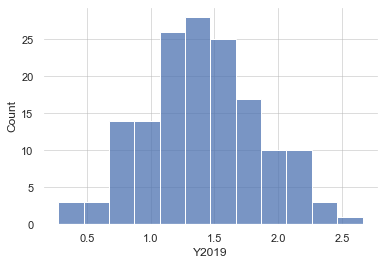

In [49]:
sns.histplot(tchange.Y2019)

In [50]:
tchange.iloc[8]

Area Code                        10
Area                      Australia
Months Code                    7020
Months          Meteorological year
Element Code                   7271
                       ...         
Y2018                         1.112
Y2019                         1.423
CC                              AUS
lat                             -27
lon                             133
Name: 440, Length: 69, dtype: object

In [51]:
lats = list(tchange['lat'])

In [52]:
tchange

,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,CC,lat,lon
32,2,Afghanistan,7020,Meteorological year,7271,Temperature change,°C,-0.080,-0.120,0.882,...,1.237,0.474,1.096,1.473,1.483,1.524,0.893,AFG,33.0,65.0
66,3,Albania,7020,Meteorological year,7271,Temperature change,°C,0.631,0.339,0.084,...,1.495,1.399,1.725,1.697,1.337,2.232,1.911,ALB,41.0,20.0
100,4,Algeria,7020,Meteorological year,7271,Temperature change,°C,0.186,0.101,0.045,...,1.267,1.774,1.224,1.866,1.630,1.326,1.224,DZA,28.0,3.0
168,6,Andorra,7020,Meteorological year,7271,Temperature change,°C,0.749,0.110,-0.755,...,0.794,1.899,1.619,1.917,1.853,1.826,1.871,AND,42.5,1.6
202,7,Angola,7020,Meteorological year,7271,Temperature change,°C,0.053,-0.139,-0.176,...,0.910,0.726,1.260,1.534,0.808,1.264,1.694,AGO,-12.5,18.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8124,236,Venezuela (Bolivarian Republic of),7020,Meteorological year,7271,Temperature change,°C,0.003,-0.132,-0.086,...,0.982,1.002,1.357,1.257,0.788,0.864,1.194,VEN,8.0,-66.0
8158,237,Viet Nam,7020,Meteorological year,7271,Temperature change,°C,0.022,-0.226,-0.305,...,0.926,0.567,1.290,1.254,1.211,0.904,1.841,VNM,16.0,106.0
8260,205,Western Sahara,7020,Meteorological year,7271,Temperature change,°C,0.528,0.470,0.248,...,1.389,1.341,1.476,1.649,2.180,0.842,1.560,ESH,24.5,-13.0
8362,251,Zambia,7020,Meteorological year,7271,Temperature change,°C,0.239,-0.165,-0.385,...,1.114,0.967,1.797,1.351,0.646,1.153,1.456,ZMB,-15.0,30.0


In [53]:
tchange['avg'] = np.nan

In [54]:
t_rst = tchange.reset_index(drop=True)

In [55]:
t_rst

,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,CC,lat,lon,avg
0,2,Afghanistan,7020,Meteorological year,7271,Temperature change,°C,-0.080,-0.120,0.882,...,0.474,1.096,1.473,1.483,1.524,0.893,AFG,33.0,65.0,NaN
1,3,Albania,7020,Meteorological year,7271,Temperature change,°C,0.631,0.339,0.084,...,1.399,1.725,1.697,1.337,2.232,1.911,ALB,41.0,20.0,NaN
2,4,Algeria,7020,Meteorological year,7271,Temperature change,°C,0.186,0.101,0.045,...,1.774,1.224,1.866,1.630,1.326,1.224,DZA,28.0,3.0,NaN
3,6,Andorra,7020,Meteorological year,7271,Temperature change,°C,0.749,0.110,-0.755,...,1.899,1.619,1.917,1.853,1.826,1.871,AND,42.5,1.6,NaN
4,7,Angola,7020,Meteorological year,7271,Temperature change,°C,0.053,-0.139,-0.176,...,0.726,1.260,1.534,0.808,1.264,1.694,AGO,-12.5,18.5,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,236,Venezuela (Bolivarian Republic of),7020,Meteorological year,7271,Temperature change,°C,0.003,-0.132,-0.086,...,1.002,1.357,1.257,0.788,0.864,1.194,VEN,8.0,-66.0,NaN
150,237,Viet Nam,7020,Meteorological year,7271,Temperature change,°C,0.022,-0.226,-0.305,...,0.567,1.290,1.254,1.211,0.904,1.841,VNM,16.0,106.0,NaN
151,205,Western Sahara,7020,Meteorological year,7271,Temperature change,°C,0.528,0.470,0.248,...,1.341,1.476,1.649,2.180,0.842,1.560,ESH,24.5,-13.0,NaN
152,251,Zambia,7020,Meteorological year,7271,Temperature change,°C,0.239,-0.165,-0.385,...,0.967,1.797,1.351,0.646,1.153,1.456,ZMB,-15.0,30.0,NaN


In [56]:
for i in range(len(t_rst)):
    t_rst.loc[i,'avg'] = np.mean(t_rst.iloc[i][7:66])

In [57]:
t_rst

,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,CC,lat,lon,avg
0,2,Afghanistan,7020,Meteorological year,7271,Temperature change,°C,-0.080,-0.120,0.882,...,0.474,1.096,1.473,1.483,1.524,0.893,AFG,33.0,65.0,0.432322
1,3,Albania,7020,Meteorological year,7271,Temperature change,°C,0.631,0.339,0.084,...,1.399,1.725,1.697,1.337,2.232,1.911,ALB,41.0,20.0,0.485492
2,4,Algeria,7020,Meteorological year,7271,Temperature change,°C,0.186,0.101,0.045,...,1.774,1.224,1.866,1.630,1.326,1.224,DZA,28.0,3.0,0.711153
3,6,Andorra,7020,Meteorological year,7271,Temperature change,°C,0.749,0.110,-0.755,...,1.899,1.619,1.917,1.853,1.826,1.871,AND,42.5,1.6,0.691475
4,7,Angola,7020,Meteorological year,7271,Temperature change,°C,0.053,-0.139,-0.176,...,0.726,1.260,1.534,0.808,1.264,1.694,AGO,-12.5,18.5,0.412932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,236,Venezuela (Bolivarian Republic of),7020,Meteorological year,7271,Temperature change,°C,0.003,-0.132,-0.086,...,1.002,1.357,1.257,0.788,0.864,1.194,VEN,8.0,-66.0,0.422508
150,237,Viet Nam,7020,Meteorological year,7271,Temperature change,°C,0.022,-0.226,-0.305,...,0.567,1.290,1.254,1.211,0.904,1.841,VNM,16.0,106.0,0.368780
151,205,Western Sahara,7020,Meteorological year,7271,Temperature change,°C,0.528,0.470,0.248,...,1.341,1.476,1.649,2.180,0.842,1.560,ESH,24.5,-13.0,0.730356
152,251,Zambia,7020,Meteorological year,7271,Temperature change,°C,0.239,-0.165,-0.385,...,0.967,1.797,1.351,0.646,1.153,1.456,ZMB,-15.0,30.0,0.451712


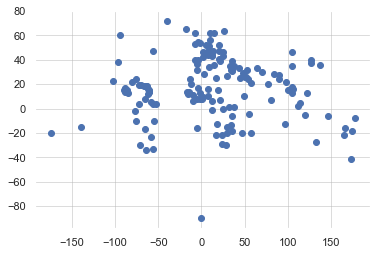

In [58]:
plt.scatter(tchange.lon,tchange.lat)

In [59]:
tchange.avg

32     NaN
66     NaN
100    NaN
168    NaN
202    NaN
        ..
8124   NaN
8158   NaN
8260   NaN
8362   NaN
8396   NaN
Name: avg, Length: 154, dtype: float64

In [60]:
fig = px.scatter(x=abs(tchange.lat),y=tchange.Y2019,color=t_rst.avg)
fig.show()

In [60]:
df = t_rst
fig = px.choropleth(df, locations="CC",
                    color="avg", # lifeExp is a column of gapminder
                    hover_name="Area", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Plasma,labels={'avg':'Temp. Change (deg C)'})
#sns.histplot(tchange.Y1961,bins=20,binrange=(-1,3))
fig.update_geos(projection_type= 'orthographic')
fig.update_layout(title='Average Temperature Change 1961-2019')
fig.show()

In [61]:
t_rst

,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,CC,lat,lon,avg
0,2,Afghanistan,7020,Meteorological year,7271,Temperature change,°C,-0.080,-0.120,0.882,...,0.474,1.096,1.473,1.483,1.524,0.893,AFG,33.0,65.0,0.432322
1,3,Albania,7020,Meteorological year,7271,Temperature change,°C,0.631,0.339,0.084,...,1.399,1.725,1.697,1.337,2.232,1.911,ALB,41.0,20.0,0.485492
2,4,Algeria,7020,Meteorological year,7271,Temperature change,°C,0.186,0.101,0.045,...,1.774,1.224,1.866,1.630,1.326,1.224,DZA,28.0,3.0,0.711153
3,6,Andorra,7020,Meteorological year,7271,Temperature change,°C,0.749,0.110,-0.755,...,1.899,1.619,1.917,1.853,1.826,1.871,AND,42.5,1.6,0.691475
4,7,Angola,7020,Meteorological year,7271,Temperature change,°C,0.053,-0.139,-0.176,...,0.726,1.260,1.534,0.808,1.264,1.694,AGO,-12.5,18.5,0.412932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,236,Venezuela (Bolivarian Republic of),7020,Meteorological year,7271,Temperature change,°C,0.003,-0.132,-0.086,...,1.002,1.357,1.257,0.788,0.864,1.194,VEN,8.0,-66.0,0.422508
150,237,Viet Nam,7020,Meteorological year,7271,Temperature change,°C,0.022,-0.226,-0.305,...,0.567,1.290,1.254,1.211,0.904,1.841,VNM,16.0,106.0,0.368780
151,205,Western Sahara,7020,Meteorological year,7271,Temperature change,°C,0.528,0.470,0.248,...,1.341,1.476,1.649,2.180,0.842,1.560,ESH,24.5,-13.0,0.730356
152,251,Zambia,7020,Meteorological year,7271,Temperature change,°C,0.239,-0.165,-0.385,...,0.967,1.797,1.351,0.646,1.153,1.456,ZMB,-15.0,30.0,0.451712


 
0.001451 x + 0.4255


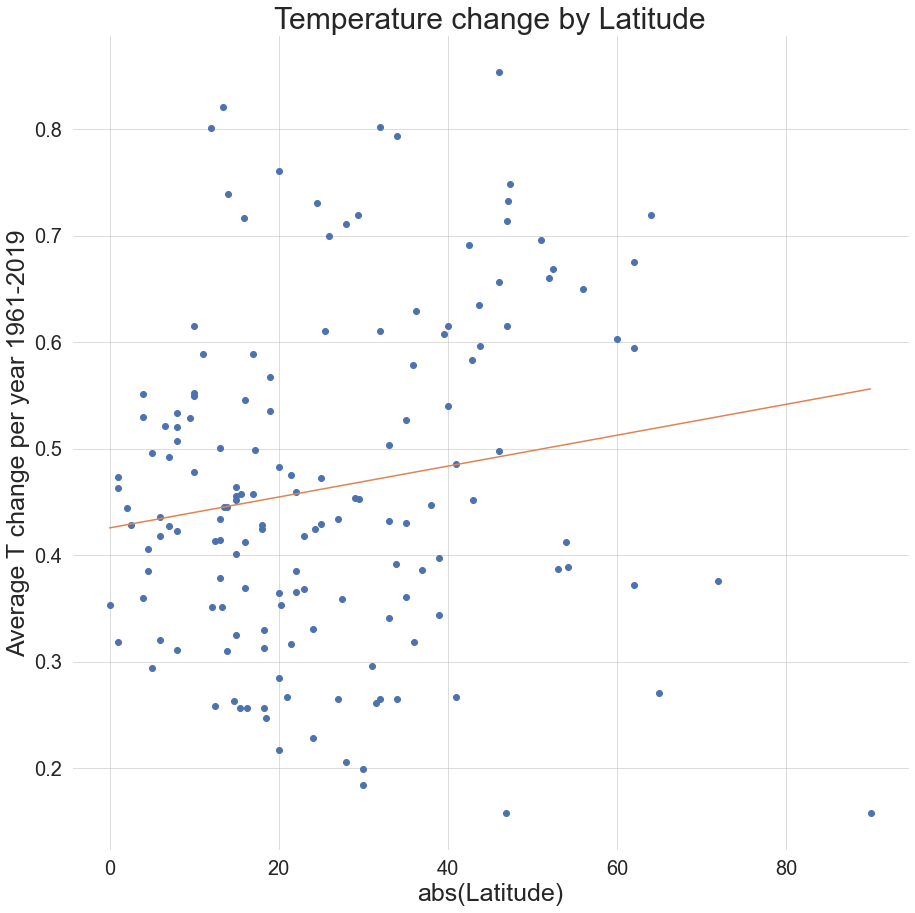

In [62]:
x = np.array(abs(t_rst.lat))
y = np.array(t_rst.avg)

z = np.polyfit(x,y,1)
f = np.poly1d(z)

xnew = np.linspace(min(x),max(x),154)
ynew = f(xnew)

fig = plt.figure(figsize=(15,15))
plt.plot(x,y,'o',xnew,ynew)
plt.title('Temperature change by Latitude',fontsize=30)
plt.xticks([0,20,40,60,80],fontsize=20)
plt.yticks([0.2,0.3,0.4,0.5,0.6,0.7,0.8],fontsize=20)
plt.xlabel('abs(Latitude)',fontsize=25)
plt.ylabel('Average T change per year 1961-2019',fontsize=25)
print(f)

 
0.004844 x + 1.275


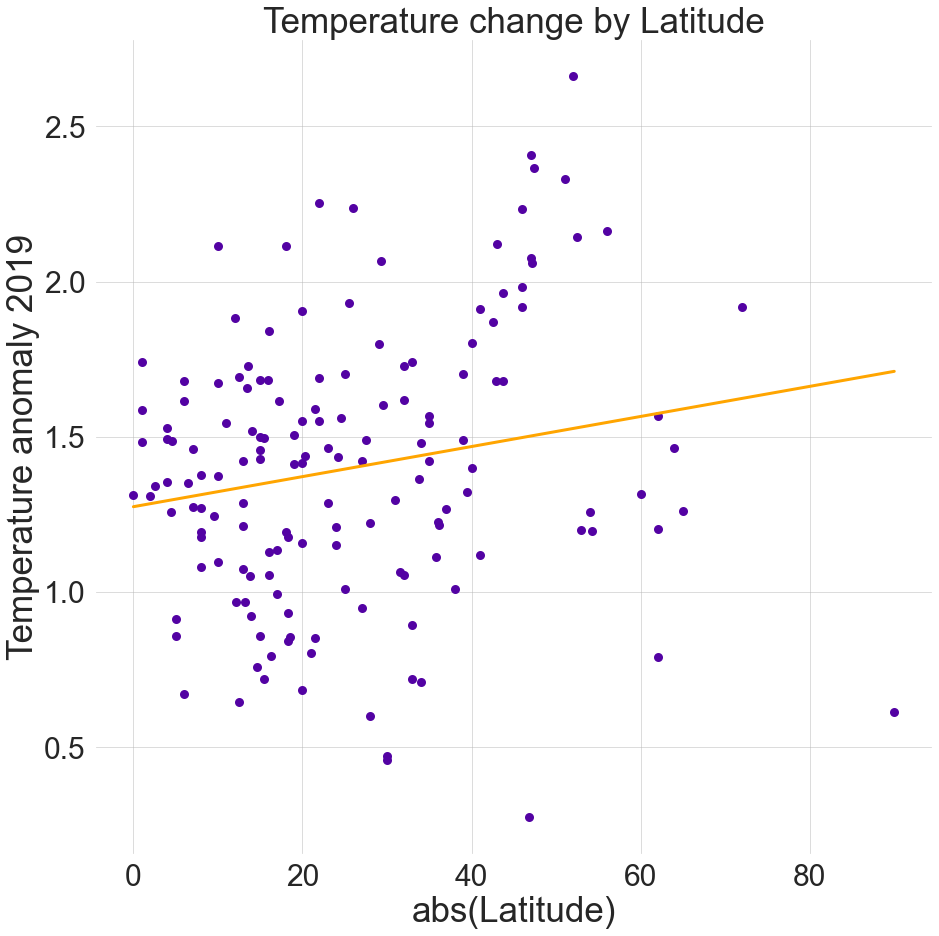

In [98]:
sns.set_palette('plasma')
# sns.set_palette('viridis')

x = np.array(abs(t_rst.lat))
y = np.array(t_rst.Y2019)

z = np.polyfit(x,y,1)
f = np.poly1d(z)

xnew = np.linspace(min(x),max(x),154)
ynew = f(xnew)

fig = plt.figure(figsize=(15,15))
plt.plot(xnew,ynew,color='orange',linewidth=3)
plt.scatter(x,y,linewidths=3)
plt.title('Temperature change by Latitude',fontsize=35)
plt.xticks([0,20,40,60,80],fontsize=30)
plt.yticks([0.5,1.0,1.5,2.0,2.5],fontsize=30)
plt.xlabel('abs(Latitude)',fontsize=35)
plt.ylabel('Temperature anomaly 2019',fontsize=35)
print(f)

In [76]:
fig = px.scatter(x = x,y = y,)
fig.show()

In [63]:
f(20)

0.4545241899944392

In [64]:
y[5],x[5]

(0.2562033898305085, 18.25)

In [65]:
res = []
for i in range(len(x)):
    res.append(y[i] - f(x[i]))

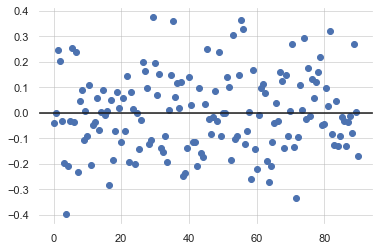

In [66]:
plt.scatter(xnew,res)
plt.axhline(y=0,c='k')

In [67]:
list(tchange.lat)[0].type()

AttributeError: 'float' object has no attribute 'type'

In [68]:
projs = ['equirectangular', 'mercator', 'orthographic', 'natural earth', 'kavrayskiy7', 'miller', 'robinson', 'eckert4', 'azimuthal equal area', 'azimuthal equidistant', 'conic equal area', 'conic conformal', 'conic equidistant', 'gnomonic', 'stereographic', 'mollweide', 'hammer', 'transverse mercator', 'albers usa', 'winkel tripel', 'aitoff', 'sinusoidal']

In [69]:
# df = tchange
# for proj in projs:

#     fig = px.choropleth(df, locations="CC",
#                         color="Y1961", # lifeExp is a column of gapminder
#                         hover_name="Area", # column to add to hover information
#                         color_continuous_scale=px.colors.sequential.Plasma,range_color=(-1,2.75),basemap_visible=True)
#     sns.histplot(tchange.Y1961,bins=20,binrange=(-1,3))
#     fig.update_geos(projection_type= proj)
#     fig.show()

$^{\circ} C$

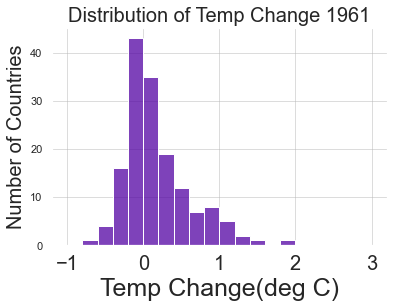

In [100]:
sns.set_palette('plasma')
df = tchange
fig = px.choropleth(df, locations="CC",
                    color="Y1961", # lifeExp is a column of gapminder
                    hover_name="Area", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Plasma,range_color=(-.75,2.75),labels={'Y1961':'Change(deg C)'})
#sns.histplot(tchange.Y1961,bins=20,binrange=(-1,3))
fig.update_geos(projection_type= 'robinson')
fig.update_layout(title='Temperature Change 1961')

sns.histplot(tchange.Y1961,bins=20,binrange=(-1,3))
plt.title('Distribution of Temp Change 1961',fontsize=20)
plt.xlabel('Temp Change(deg C)',fontsize=25)
plt.ylabel('Number of Countries',fontsize=20)
plt.xticks(np.arange(-1,4),fontsize=20)


fig.update_layout(
    font=dict(
    
        size=20,
    ))


fig.show()

In [71]:
np.linspace(1961,2019,4)

array([1961.        , 1980.33333333, 1999.66666667, 2019.        ])

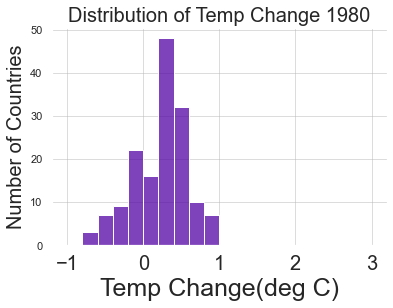

In [72]:
df = tchange
fig = px.choropleth(df, locations="CC",
                    color="Y1980", # lifeExp is a column of gapminder
                    hover_name="Area", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Plasma,range_color=(-.75,2.75),labels={'Y1980':'Change(deg C)'})
#sns.histplot(tchange.Y1961,bins=20,binrange=(-1,3))
fig.update_geos(projection_type= 'robinson')
fig.update_layout(title='Temperature Change 1980')

sns.histplot(tchange.Y1980,bins=20,binrange=(-1,3))
plt.title('Distribution of Temp Change 1980',fontsize=20)
plt.xlabel('Temp Change(deg C)',fontsize=25)
plt.ylabel('Number of Countries',fontsize=20)
plt.xticks(np.arange(-1,4),fontsize=20)


fig.update_layout(
    font=dict(
        
        size=18,
    ))


fig.show()

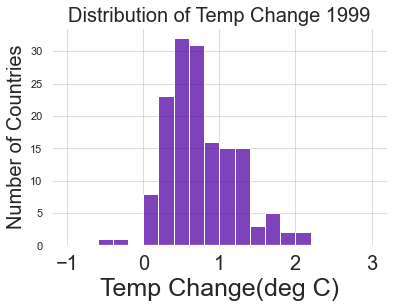

In [73]:
df = tchange
fig = px.choropleth(df, locations="CC",
                    color="Y1999", # lifeExp is a column of gapminder
                    hover_name="Area", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Plasma,range_color=(-.75,2.75),labels={'Y1999':'Change(deg C)'})
#sns.histplot(tchange.Y1961,bins=20,binrange=(-1,3))
fig.update_geos(projection_type= 'robinson')
fig.update_layout(title='Temperature Change 1999')


sns.histplot(tchange.Y1999,bins=20,binrange=(-1,3))
plt.title('Distribution of Temp Change 1999',fontsize=20)
plt.xlabel('Temp Change(deg C)',fontsize=25)
plt.ylabel('Number of Countries',fontsize=20)
plt.xticks(np.arange(-1,4),fontsize=20)


fig.update_layout(
    font=dict(
        
        size=18,
    ))


fig.show()

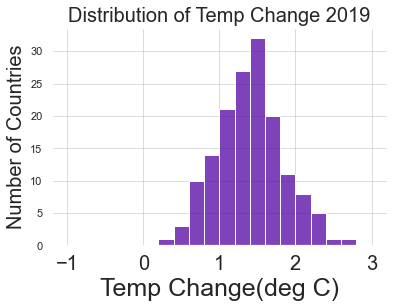

In [74]:
df = tchange
fig = px.choropleth(df, locations="CC",
                    color="Y2019", # lifeExp is a column of gapminder
                    hover_name="Area", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Plasma,range_color=(-.75,2.75),labels={'Y2019':'Change(deg C)'})
#sns.histplot(tchange.Y1961,bins=20,binrange=(-1,3))
fig.update_geos(projection_type= 'robinson')
fig.update_layout(title='Temperature Change 2019')

sns.histplot(tchange.Y2019,bins=20,binrange=(-1,3))
plt.title('Distribution of Temp Change 2019',fontsize=20)
plt.xlabel('Temp Change(deg C)',fontsize=25)
plt.ylabel('Number of Countries',fontsize=20)
plt.xticks(np.arange(-1,4),fontsize=20)


fig.update_layout(
    font=dict(
        
        size=18,
    ))


fig.show()

In [75]:
regions = 'World', 'Africa',\
       'Eastern Africa', 'Middle Africa', 'Northern Africa',\
       'Southern Africa', 'Western Africa', 'Americas',\
       'Northern America', 'Central America', 'Caribbean',\
       'South America', 'Asia', 'Central Asia', 'Eastern Asia',\
       'Southern Asia', 'South-Eastern Asia', 'Western Asia', 'Europe',\
       'Eastern Europe', 'Northern Europe', 'Southern Europe',\
       'Western Europe', 'Oceania', 'Australia and New Zealand',\
       'Melanesia', 'Micronesia', 'Polynesia', 'European Union'

In [76]:
regdata = newdt[newdt['Months Code'] == 7020][newdt[newdt['Months Code'] == 7020]['Element Code'] == 7271].reset_index().loc[247:].set_index('Area',drop=False)

In [77]:
contdata = regdata[ (regdata['Area'] == 'Africa') | (regdata['Area'] == 'Northern America') | (regdata['Area'] == 'South America') | (regdata['Area'] == 'Asia') | (regdata['Area'] == 'Europe') | (regdata['Area'] == 'Oceania')]
continents = contdata['Area']

In [78]:
yearssince = np.arange(0,59)
angyrssince = 2*np.pi*yearssince/max(yearssince)

In [79]:
CB_color_cycle = ['#377eb8', '#ff7f00', '#4daf4a',
                  '#f781bf', '#a65628', '#984ea3',
                  '#999999', '#e41a1c', '#dede00']

In [80]:
sns.color_palette(CB_color_cycle)

[(0.21568627450980393, 0.49411764705882355, 0.7215686274509804),
 (1.0, 0.4980392156862745, 0.0),
 (0.30196078431372547, 0.6862745098039216, 0.2901960784313726),
 (0.9686274509803922, 0.5058823529411764, 0.7490196078431373),
 (0.6509803921568628, 0.33725490196078434, 0.1568627450980392),
 (0.596078431372549, 0.3058823529411765, 0.6392156862745098),
 (0.6, 0.6, 0.6),
 (0.8941176470588236, 0.10196078431372549, 0.10980392156862745),
 (0.8705882352941177, 0.8705882352941177, 0.0)]

In [81]:
sns.set(rc={'axes.facecolor':'white','grid.color':'#bababa'})

In [82]:
#sns.set_palette(CB_color_cycle)
# sns.set_palette('viridis')
sns.set_palette('plasma')

In [83]:
sns.color_palette('plasma',n_colors=10)

[(0.241396, 0.014979, 0.610259),
 (0.387183, 0.001434, 0.654177),
 (0.523633, 0.024532, 0.652901),
 (0.650746, 0.125309, 0.595617),
 (0.752312, 0.227133, 0.513149),
 (0.836801, 0.329105, 0.430905),
 (0.907365, 0.434524, 0.35297),
 (0.963203, 0.553865, 0.271909),
 (0.991985, 0.681179, 0.195295),
 (0.986509, 0.822401, 0.143557)]

In [84]:
for i in range(10):
    print(i,np.array(sns.color_palette('plasma',n_colors=10)[i])*255)

0 [ 61.55598    3.819645 155.616045]
1 [ 98.731665   0.36567  166.815135]
2 [133.526415   6.25566  166.489755]
3 [165.94023   31.953795 151.882335]
4 [191.83956   57.918915 130.852995]
5 [213.384255  83.921775 109.880775]
6 [231.378075 110.80362   90.00735 ]
7 [245.616765 141.235575  69.336795]
8 [252.956175 173.700645  49.800225]
9 [251.559795 209.712255  36.607035]


In [85]:
my_palette = ['#3e049c','#fcd125','red','#d5546e','#f68c45','green']

In [86]:
sns.color_palette(my_palette)

[(0.24313725490196078, 0.01568627450980392, 0.611764705882353),
 (0.9882352941176471, 0.8196078431372549, 0.1450980392156863),
 (1.0, 0.0, 0.0),
 (0.8352941176470589, 0.32941176470588235, 0.43137254901960786),
 (0.9647058823529412, 0.5490196078431373, 0.27058823529411763),
 (0.0, 0.5019607843137255, 0.0)]

In [87]:
labels = list(np.floor(np.arange(1961,2019,(2019-1961)/9)))
s_lab = []
for year in labels:
    s_lab.append(str(int(year)))
s_lab[0] = '1961 / 2019'
s_lab

['1961 / 2019', '1967', '1973', '1980', '1986', '1993', '1999', '2006', '2012']

In [88]:
regdata

,index,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,...,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,CC,lat,lon
Area,,,,,,,,,,,,,,,,,,,,,
World,8430,5000,World,7020,Meteorological year,7271,Temperature change,°C,0.207,0.034,...,1.021,1.052,1.419,1.674,1.440,1.301,1.473,NaN,-20.0,30.0
Africa,8464,5100,Africa,7020,Meteorological year,7271,Temperature change,°C,-0.017,-0.040,...,1.014,1.036,1.208,1.442,1.224,1.222,1.415,NaN,-20.0,30.0
Eastern Africa,8498,5101,Eastern Africa,7020,Meteorological year,7271,Temperature change,°C,0.252,-0.120,...,0.960,0.971,1.353,1.338,1.304,0.983,1.515,NaN,-20.0,30.0
Middle Africa,8532,5102,Middle Africa,7020,Meteorological year,7271,Temperature change,°C,-0.100,-0.176,...,0.863,0.799,1.095,1.325,1.097,1.279,1.476,NaN,-20.0,30.0
Northern Africa,8566,5103,Northern Africa,7020,Meteorological year,7271,Temperature change,°C,-0.030,0.129,...,1.240,1.515,1.097,1.712,1.212,1.519,1.175,NaN,-20.0,30.0
Southern Africa,8600,5104,Southern Africa,7020,Meteorological year,7271,Temperature change,°C,0.212,0.130,...,0.884,0.611,1.439,1.647,0.874,1.159,1.911,NaN,-20.0,30.0
Western Africa,8634,5105,Western Africa,7020,Meteorological year,7271,Temperature change,°C,-0.289,-0.120,...,1.067,1.073,1.191,1.322,1.441,1.142,1.266,NaN,-20.0,30.0
Americas,8668,5200,Americas,7020,Meteorological year,7271,Temperature change,°C,0.052,-0.084,...,0.864,0.733,1.361,1.755,1.340,0.960,1.246,NaN,-20.0,30.0
Northern America,8702,5203,Northern America,7020,Meteorological year,7271,Temperature change,°C,0.017,-0.058,...,0.902,0.389,1.330,2.273,1.426,0.873,1.179,NaN,-20.0,30.0


In [89]:
sns.color_palette('tab10')

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

In [90]:
my_pal = sns.color_palette(sns.color_palette('tab10')[:2]+sns.color_palette('tab10')[3:])

In [91]:
sns.color_palette([sns.color_palette('tab10')[0],sns.color_palette('tab10')[1],sns.color_palette('tab10')[3],sns.color_palette('tab10')[4],sns.color_palette('tab10')[5]])

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354)]

<ipython-input-94-d326e86a6d4c>:11: UserWarning:

FixedFormatter should only be used together with FixedLocator

<ipython-input-94-d326e86a6d4c>:12: UserWarning:

FixedFormatter should only be used together with FixedLocator



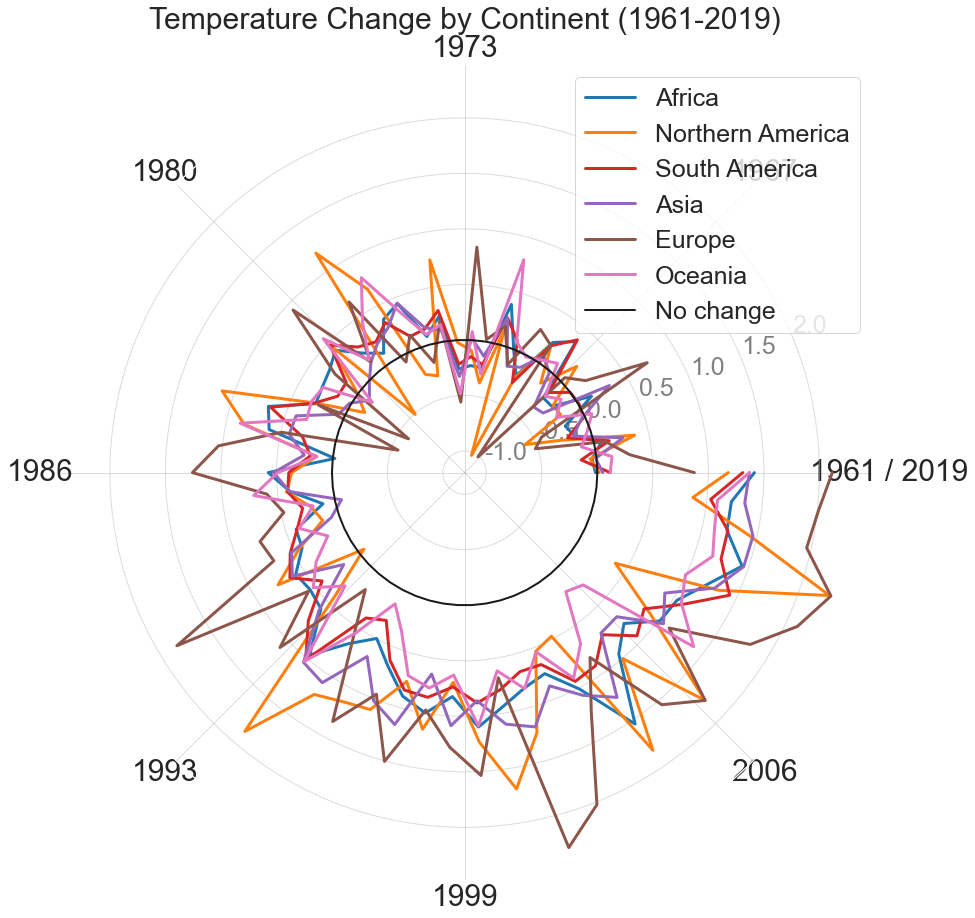

In [94]:
sns.set_palette(my_pal)
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'},figsize=(15,15))
for cont in continents:

    #current = regdata[regdata['Area'] == reg]
    
    vals = list(regdata.loc[cont][8:67])
#         ax.set_xticklabels(s_lab)
    ax.plot(angyrssince,vals,label=cont,linewidth=3)
ax.plot(angyrssince,np.zeros(len(angyrssince)),label='No change',c='k',linewidth=2)
ax.set_xticklabels(s_lab,fontsize=30)
ax.set_yticklabels(np.linspace(-1,2,7),fontsize=25,color='gray')
    
plt.legend(fontsize=25)
plt.title('Temperature Change by Continent (1961-2019)',fontsize='30')

plt.savefig('RandConts.png',dpi=500,pad_inches=0,transparent=True)

# ax.set_ylim([-1,2.5])
#plt.axhline(y=0,c='r')
#plt.ylabel('Temperature Anomaly')
#plt.xlabel('Year')

In [236]:
regdata.index

Index(['World', 'Africa', 'Eastern Africa', 'Middle Africa', 'Northern Africa',
       'Southern Africa', 'Western Africa', 'Americas', 'Northern America',
       'Central America', 'Caribbean', 'South America', 'Asia', 'Central Asia',
       'Eastern Asia', 'Southern Asia', 'South-Eastern Asia', 'Western Asia',
       'Europe', 'Eastern Europe', 'Northern Europe', 'Southern Europe',
       'Western Europe', 'Oceania', 'Australia and New Zealand', 'Melanesia',
       'Micronesia', 'Polynesia', 'European Union',
       'Least Developed Countries', 'Land Locked Developing Countries',
       'Small Island Developing States', 'Low Income Food Deficit Countries',
       'Net Food Importing Developing Countries', 'Annex I countries',
       'Non-Annex I countries', 'OECD'],
      dtype='object', name='Area')

In [237]:
areas_ = ['Europe','Least Developed Countries']

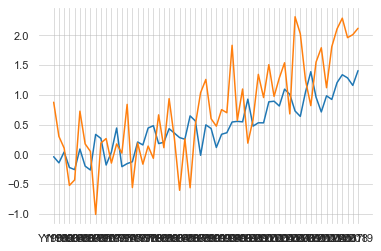

In [238]:
plt.plot(regdata.loc['Least Developed Countries'][8:67])
plt.plot(regdata.loc['Europe'][8:67])


In [239]:
regdata.index

Index(['World', 'Africa', 'Eastern Africa', 'Middle Africa', 'Northern Africa',
       'Southern Africa', 'Western Africa', 'Americas', 'Northern America',
       'Central America', 'Caribbean', 'South America', 'Asia', 'Central Asia',
       'Eastern Asia', 'Southern Asia', 'South-Eastern Asia', 'Western Asia',
       'Europe', 'Eastern Europe', 'Northern Europe', 'Southern Europe',
       'Western Europe', 'Oceania', 'Australia and New Zealand', 'Melanesia',
       'Micronesia', 'Polynesia', 'European Union',
       'Least Developed Countries', 'Land Locked Developing Countries',
       'Small Island Developing States', 'Low Income Food Deficit Countries',
       'Net Food Importing Developing Countries', 'Annex I countries',
       'Non-Annex I countries', 'OECD'],
      dtype='object', name='Area')

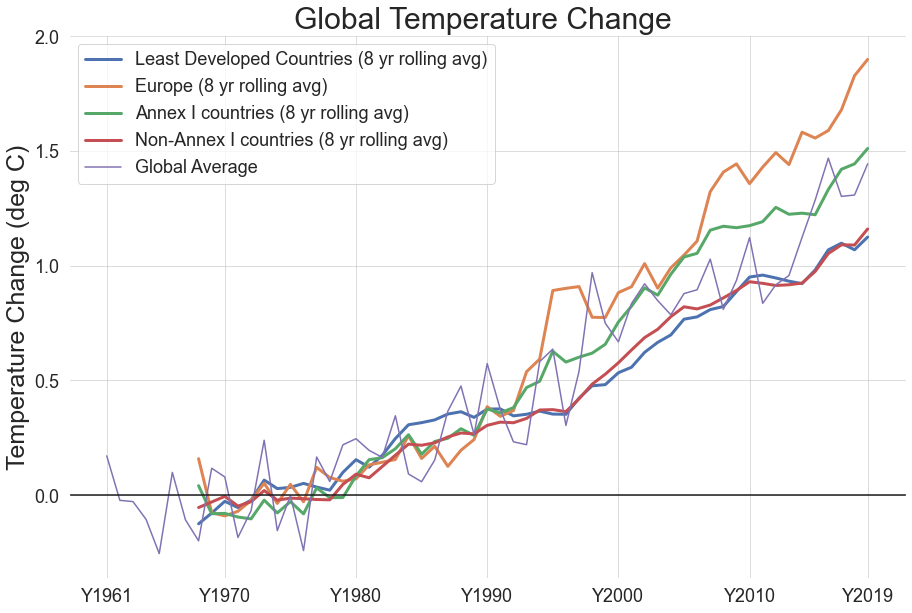

In [241]:
sns.set(rc={'axes.facecolor':'white','grid.color':'#bababa','grid.alpha':0.5})
fig = plt.figure(figsize=(15,10))




plt.plot(pd.DataFrame(regdata.loc['Least Developed Countries'][8:67]).rolling(8).mean(),label='Least Developed Countries (8 yr rolling avg)',linewidth=3)
plt.plot(pd.DataFrame(regdata.loc['Europe'][8:67]).rolling(8).mean(),label='Europe (8 yr rolling avg)',linewidth=3)
plt.plot(pd.DataFrame(regdata.loc['Annex I countries'][8:67]).rolling(8).mean(),label='Annex I countries (8 yr rolling avg)',linewidth=3)
plt.plot(pd.DataFrame(regdata.loc['Non-Annex I countries'][8:67]).rolling(8).mean(),label='Non-Annex I countries (8 yr rolling avg)',linewidth=3)

plt.plot(test.iloc[285,:],label='Global Average')

plt.axhline(y=0,c='k')
plt.xticks([0,9,19,29,39,49,58],fontsize=18)
plt.yticks(fontsize=18)
plt.title('Global Temperature Change ',fontsize=30)
plt.ylabel('Temperature Change (deg C)',fontsize=25)
plt.legend(fontsize=18)


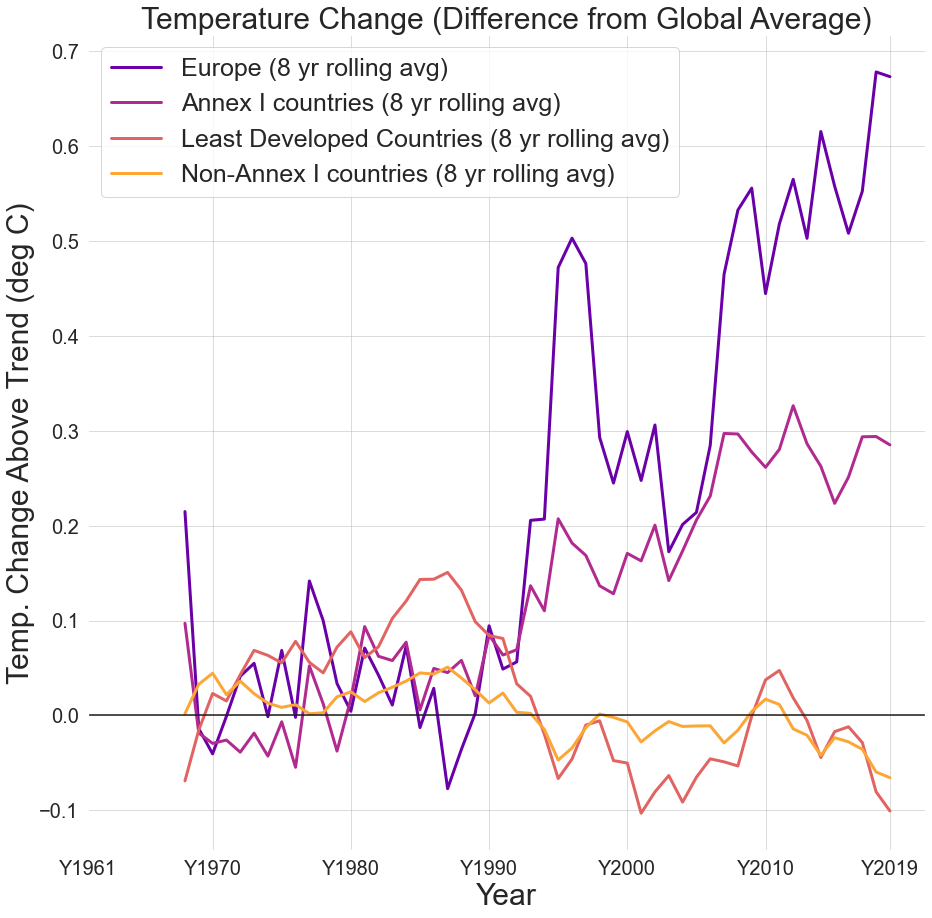

In [271]:
globavg = test.iloc[285,:]

sns.set(rc={'axes.facecolor':'white','grid.color':'#bababa','grid.alpha':0.5})
sns.set_palette('plasma',n_colors=4)
fig = plt.figure(figsize=(15,15))





plt.plot(pd.DataFrame(regdata.loc['Europe'][8:67]-globavg).rolling(8).mean(),label='Europe (8 yr rolling avg)',linewidth=3)
plt.plot(pd.DataFrame(regdata.loc['Annex I countries'][8:67]-globavg).rolling(8).mean(),label='Annex I countries (8 yr rolling avg)',linewidth=3)
plt.plot(pd.DataFrame(regdata.loc['Least Developed Countries'][8:67]-globavg).rolling(8).mean(),label='Least Developed Countries (8 yr rolling avg)',linewidth=3)
plt.plot(pd.DataFrame(regdata.loc['Non-Annex I countries'][8:67]-globavg).rolling(8).mean(),label='Non-Annex I countries (8 yr rolling avg)',linewidth=3)


plt.axhline(y=0,c='k')
plt.xticks([0,9,19,29,39,49,58],fontsize=20)
plt.yticks(fontsize=20)
plt.title('Temperature Change (Difference from Global Average)',fontsize=30)
plt.ylabel('Temp. Change Above Trend (deg C)',fontsize=30)
plt.xlabel('Year',fontsize=30)
plt.legend(fontsize=25)

# plt.savefig('DiffromAvg.png',dpi=500)


<ipython-input-168-0d2982e9872b>:12: UserWarning:

FixedFormatter should only be used together with FixedLocator

<ipython-input-168-0d2982e9872b>:13: UserWarning:

FixedFormatter should only be used together with FixedLocator



Text(0.5, 1.0, 'Temperature Change by Continent (1961-2019)')

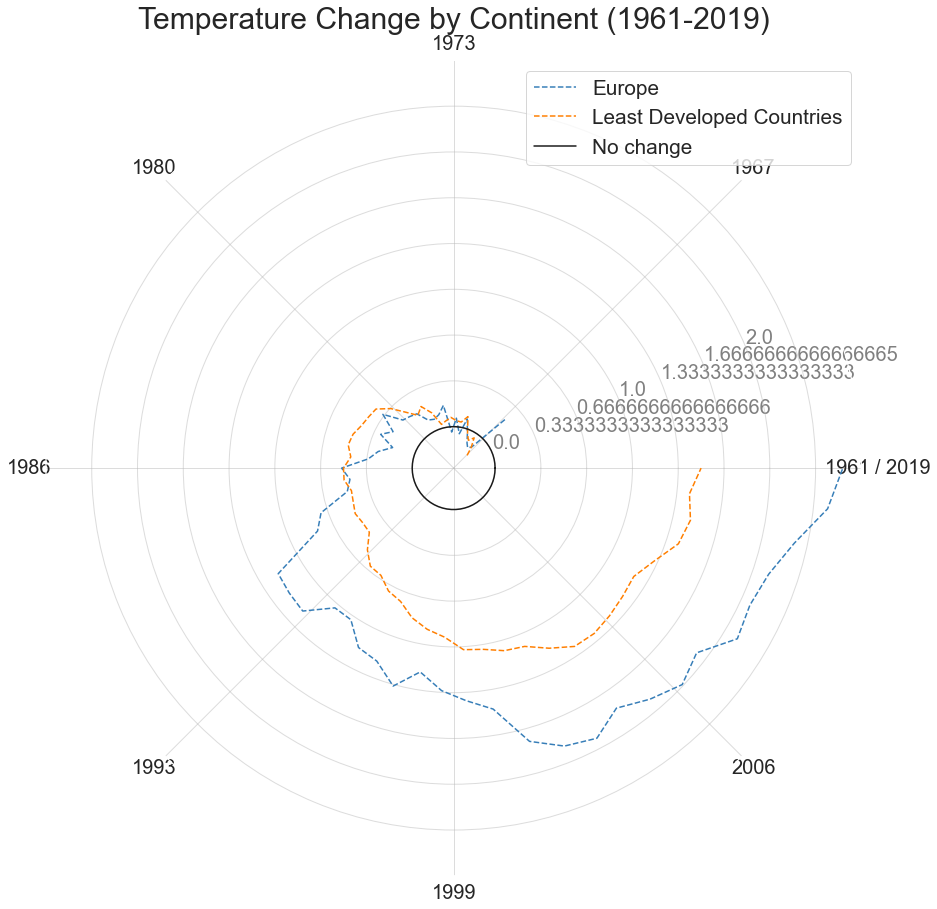

In [168]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'},figsize=(15,15))
for area in areas_:

    #current = regdata[regdata['Area'] == reg]
    
    vals = list(regdata.loc[area][8:67])
    roll = pd.DataFrame(regdata.loc[area][8:67]).rolling(8).mean()
#         ax.set_xticklabels(s_lab)
#     ax.plot(angyrssince,vals,label=area)
    ax.plot(angyrssince,roll,label=area,linestyle='--')
ax.plot(angyrssince,np.zeros(len(angyrssince)),label='No change',c='k')
ax.set_xticklabels(s_lab,fontsize=20)
ax.set_yticklabels(np.linspace(0,2,7),fontsize=20,color='gray')
    
plt.legend(fontsize='xx-large')
plt.title('Temperature Change by Continent (1961-2019)',fontsize='30')
# ax.set_ylim([-1,2.5])
#plt.axhline(y=0,c='r')
#plt.ylabel('Temperature Anomaly')
#plt.xlabel('Year')

In [85]:
alldt.loc[::2]

,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2010,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019
0,2,Afghanistan,7001,January,7271,Temperature change,°C,0.777,0.062,2.744,...,3.601,1.179,-0.583,1.233,1.755,1.943,3.416,1.201,1.996,2.951
2,2,Afghanistan,7002,February,7271,Temperature change,°C,-1.743,2.465,3.919,...,1.212,0.321,-3.201,1.494,-3.187,2.699,2.251,-0.323,2.705,0.086
4,2,Afghanistan,7003,March,7271,Temperature change,°C,0.516,1.336,0.403,...,3.390,0.748,-0.527,2.246,-0.076,-0.497,2.296,0.834,4.418,0.234
6,2,Afghanistan,7004,April,7271,Temperature change,°C,-1.709,0.117,0.919,...,2.591,1.712,1.417,-0.052,0.585,1.589,0.980,1.252,1.442,0.899
8,2,Afghanistan,7005,May,7271,Temperature change,°C,1.412,-0.092,-0.690,...,1.419,3.643,0.909,1.201,0.959,1.862,3.246,3.280,0.855,0.647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9646,5873,OECD,7016,DecJanFeb,7271,Temperature change,°C,0.561,-0.362,-0.222,...,1.272,0.770,1.709,1.327,0.686,1.307,2.636,1.884,1.453,1.527
9648,5873,OECD,7017,MarAprMay,7271,Temperature change,°C,-0.038,-0.189,0.141,...,1.742,0.390,1.442,0.475,0.778,1.191,1.928,1.237,1.241,1.352
9650,5873,OECD,7018,JunJulAug,7271,Temperature change,°C,0.101,0.052,-0.047,...,1.012,0.954,1.061,1.119,0.779,0.958,1.303,1.081,1.078,1.078
9652,5873,OECD,7019,SepOctNov,7271,Temperature change,°C,0.036,0.461,0.665,...,0.958,1.106,0.885,1.041,0.999,1.670,1.535,1.194,0.581,1.233


In [86]:
avgdt = alldt.loc[::2].copy()

In [98]:
usdt = avgdt[avgdt['Area'] == 'United States of America'].reset_index(drop=True)

In [103]:
usdt.iloc[:12]

,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,avg
0,231,United States of America,7001,January,7271,Temperature change,°C,0.943,-0.771,-1.170,...,0.616,1.548,2.060,1.913,2.033,2.675,2.128,1.600,1.866,NaN
1,231,United States of America,7002,February,7271,Temperature change,°C,1.215,1.425,0.577,...,-0.048,2.438,0.662,-0.347,0.389,3.788,3.528,1.765,0.375,NaN
2,231,United States of America,7003,March,7271,Temperature change,°C,0.656,-1.082,1.400,...,1.251,3.688,0.162,0.220,2.532,3.778,1.844,1.632,1.404,NaN
3,231,United States of America,7004,April,7271,Temperature change,°C,-1.210,0.409,0.399,...,0.546,2.043,-1.015,0.760,1.535,1.998,1.978,-0.414,1.411,NaN
4,231,United States of America,7005,May,7271,Temperature change,°C,-0.348,0.671,0.503,...,-0.124,1.414,0.141,0.919,1.044,0.787,0.521,2.538,0.307,NaN
5,231,United States of America,7006,June,7271,Temperature change,°C,0.339,-0.306,-0.165,...,0.709,1.057,1.369,0.444,1.632,1.773,1.100,1.480,0.677,NaN
6,231,United States of America,7007,July,7271,Temperature change,°C,-0.313,-0.515,-0.089,...,1.089,1.335,0.536,-0.118,0.371,1.078,1.259,1.159,1.045,NaN
7,231,United States of America,7008,August,7271,Temperature change,°C,0.190,0.203,-0.072,...,1.292,0.870,0.631,0.370,0.445,1.093,0.100,0.738,1.018,NaN
8,231,United States of America,7009,September,7271,Temperature change,°C,-0.467,-0.511,0.814,...,0.830,0.695,0.882,0.827,1.561,1.295,0.918,1.638,2.021,NaN
9,231,United States of America,7010,October,7271,Temperature change,°C,-0.405,1.076,2.218,...,0.716,-0.022,0.565,1.297,1.950,2.036,1.230,0.670,-0.269,NaN


In [107]:
usdt.iloc[:12,7]

0     0.943
1     1.215
2     0.656
3    -1.210
4    -0.348
5     0.339
6    -0.313
7     0.190
8    -0.467
9    -0.405
10   -0.692
11   -1.652
Name: Y1961, dtype: float64

In [105]:
usdt.iloc[:12,65]

0     1.866
1     0.375
2     1.404
3     1.411
4     0.307
5     0.677
6     1.045
7     1.018
8     2.021
9    -0.269
10    0.514
11    1.988
Name: Y2019, dtype: float64

In [113]:
usbymonth = []
for yr in range(59):
    usbymonth += list(usdt.iloc[:12,7+yr])
len(usbymonth)

708

array([  0,  12,  24,  36,  48,  60,  72,  84,  96, 108, 120, 132, 144,
       156, 168, 180, 192, 204, 216, 228, 240, 252, 264, 276, 288, 300,
       312, 324, 336, 348, 360, 372, 384, 396, 408, 420, 432, 444, 456,
       468, 480, 492, 504, 516, 528, 540, 552, 564, 576, 588, 600, 612,
       624, 636, 648, 660, 672, 684, 696, 708])

AttributeError: 'Figure' object has no attribute 'setxticks'

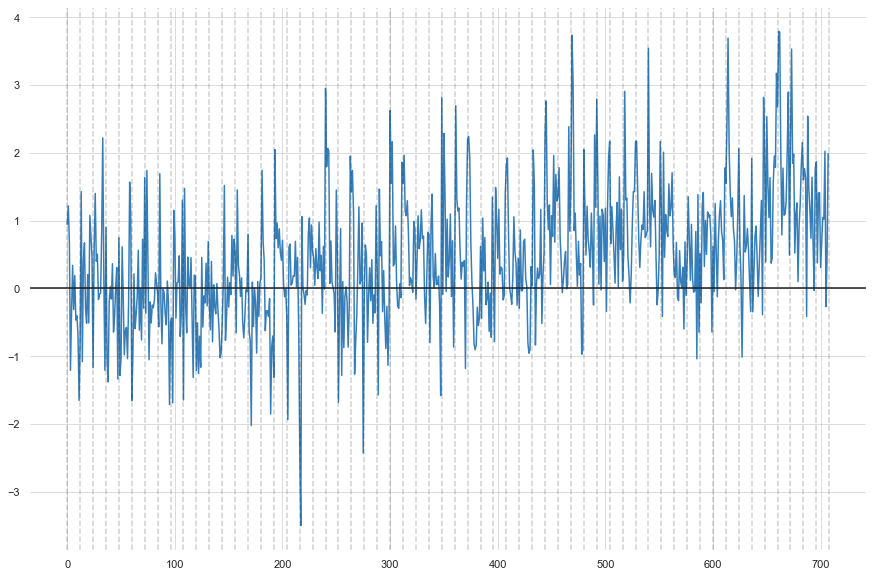

In [132]:
fig = plt.figure(figsize=(15,10))
yrs = np.arange(0,709,12)
plt.plot(usbymonth)
plt.axhline(y=0,c='k')
for x in yrs:
    plt.axvline(x=x,color='k',linestyle='--',alpha=0.2)
fig.setxticks([1961,1980,1999,2019])